# Test PDPbox with multiclass classification problem
## Kaggle Otto Group with RandomForest
This demo is based on **Otto Group Product Classification Challenge**  
https://www.kaggle.com/c/otto-group-product-classification-challenge

In [1]:
import pandas as pd
from pdpbox import pdp, get_example, info_plots

c:\Users\liangch\Anaconda3\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
import warnings
warnings.filterwarnings("ignore")

# versions

In [3]:
import matplotlib
print(matplotlib.__version__)

3.7.1


In [4]:
import sklearn
print(sklearn.__version__)

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

1.2.2


# train a simple RandomForestClassifier
We assume there is a `otto-group-product-classification-challenge` data folder under the same directory. The dataset is directly downloaded from kaggle with command `kaggle competitions download -c otto-group-product-classification-challenge`.

# [for internal usage] save for unit test and tutorial

# or you can directory load the data and model from example

In [5]:
test_otto = get_example.otto()
test_otto.keys()

dict_keys(['data', 'rf_model', 'features', 'target'])

In [6]:
otto_data = test_otto['data']
otto_features = test_otto['features']
otto_model = test_otto['rf_model']
otto_target = test_otto['target']

In [43]:
test_otto['rf_model']

RandomForestClassifier(max_features='auto', n_estimators=30, n_jobs=4,
                       random_state=42)

In [20]:
otto_data

,id,feat_1,feat_2,feat_3,feat_4,feat_5,feat_6,feat_7,feat_8,feat_9,...,target,target_0,target_1,target_2,target_3,target_4,target_5,target_6,target_7,target_8
0,1,1,0,0,0,0,0,0,0,0,...,Class_1,1,0,0,0,0,0,0,0,0
1,2,0,0,0,0,0,0,0,1,0,...,Class_1,1,0,0,0,0,0,0,0,0
2,3,0,0,0,0,0,0,0,1,0,...,Class_1,1,0,0,0,0,0,0,0,0
3,4,1,0,0,1,6,1,5,0,0,...,Class_1,1,0,0,0,0,0,0,0,0
4,5,0,0,0,0,0,0,0,0,0,...,Class_1,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61873,61874,1,0,0,1,1,0,0,0,0,...,Class_9,0,0,0,0,0,0,0,0,1
61874,61875,4,0,0,0,0,0,0,0,0,...,Class_9,0,0,0,0,0,0,0,0,1
61875,61876,0,0,0,0,0,0,0,3,1,...,Class_9,0,0,0,0,0,0,0,0,1
61876,61877,1,0,0,0,0,0,0,0,0,...,Class_9,0,0,0,0,0,0,0,0,1


In [15]:
otto_data.shape

(61878, 104)

In [11]:
otto_data["target"].value_counts()

Class_2    16122
Class_6    14135
Class_8     8464
Class_3     8004
Class_9     4955
Class_7     2839
Class_5     2739
Class_4     2691
Class_1     1929
Name: target, dtype: int64

# 1. single numeric feature: 'feat_67'

## 1.1 target distribution through feature 'feat_67'

In [12]:
target_67 = info_plots.TargetPlot(
    df=otto_data,
    feature="feat_67",
    feature_name="feat_67",
    target=otto_target[1:],
    num_grid_points=10,
    grid_type='percentile',
    percentile_range=None,
    grid_range=None,
    cust_grid_points=None,
    show_outliers=False,
    endpoint=True,
)

In [13]:
fig, axes, summary_df = target_67.plot(
    which_classes=None,
    show_percentile=True,
    figsize=(1200, 400),
    ncols=2,
    plot_params={"gaps": {"outer_y": 0.05}},
    engine='plotly',
    template='plotly_white',
)
fig

In [21]:
fig, axes, summary_df = target_67.plot(
    which_classes=[1, 2],
    show_percentile=True,
    figsize=(1200, 400),
    ncols=2,
    plot_params={"gaps": {"outer_y": 0.05, "top": 0.1}},
    engine='plotly',
    template='plotly_white',
)
fig

In [14]:
summary_df

,x,value,percentile,count,target_0,target_1,target_2,target_3,target_4,target_5,target_6,target_7,target_8
0,0,"[0.0, 1.0)","[0.0, 44.44)",23930,0.013414,0.235395,0.172628,0.078354,0.061513,0.280527,0.040953,0.097451,0.019766
1,1,"[1.0, 2.0)","[44.44, 55.56)",9878,0.019640,0.345212,0.112371,0.041203,0.044037,0.278801,0.033306,0.089593,0.035837
2,2,"[2.0, 3.0)","[55.56, 66.67)",6689,0.023471,0.337270,0.095978,0.026910,0.077590,0.165944,0.037973,0.149948,0.084916
3,3,"[3.0, 4.0)","[66.67, 77.78)",4434,0.036761,0.337844,0.107127,0.018042,0.038340,0.157871,0.039693,0.182228,0.082093
4,4,"[4.0, 7.0)","[77.78, 88.89)",8985,0.046633,0.265888,0.106845,0.011909,0.014802,0.193100,0.046077,0.195437,0.119310
5,5,"[7.0, 104.0]","[88.89, 100.0]",7962,0.084778,0.117558,0.086159,0.005275,0.001256,0.141045,0.086159,0.211002,0.266767


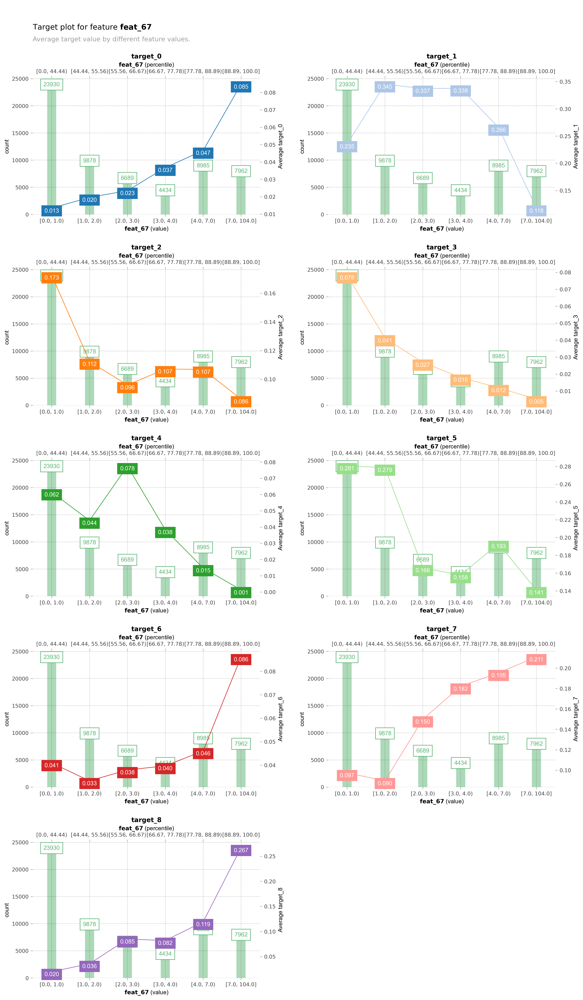

In [22]:
fig, axes, summary_df = target_67.plot(
    show_percentile=True,
    figsize=(16, 6),
    dpi=300,
    ncols=2,
    plot_params={"gaps": {"outer_y": 0.4}, "title": {"subplot_title": {"fontsize": 11}}},
    engine='matplotlib',
)

## 1.2 check prediction distribution through feature 'feat_67'

In [23]:
predict_67 = info_plots.PredictPlot(
    model=otto_model,
    df=otto_data,
    model_features=otto_features,
    feature="feat_67",
    feature_name="feat_67",
    pred_func=None,
    n_classes=None,
    num_grid_points=10,
    grid_type='percentile',
    percentile_range=None,
    grid_range=None,
    cust_grid_points=None,
    show_outliers=False,
    endpoint=True,
    predict_kwds={},
    chunk_size=-1,
)

obtain pred_func from the provided model.


In [24]:
fig, axes, summary_df = predict_67.plot(
    show_percentile=True,
    figsize=None,
    ncols=2,
    plot_params=None,
    engine='plotly',
    template='plotly_white',
)
fig

In [18]:
summary_df

,x,value,percentile,count,pred_0_q1,pred_0_q2,pred_0_q3,pred_1_q1,pred_1_q2,pred_1_q3,...,pred_5_q3,pred_6_q1,pred_6_q2,pred_6_q3,pred_7_q1,pred_7_q2,pred_7_q3,pred_8_q1,pred_8_q2,pred_8_q3
0,0,"[0.0, 1.0)","[0.0, 44.44)",23930,0.0,0.0,0.000000,0.0,0.066667,0.400000,...,0.900000,0.0,0.0,0.033333,0.0,0.000000,0.000000,0.0,0.000000,0.000000
1,1,"[1.0, 2.0)","[44.44, 55.56)",9878,0.0,0.0,0.000000,0.0,0.066667,0.833333,...,0.866667,0.0,0.0,0.000000,0.0,0.000000,0.033333,0.0,0.000000,0.000000
2,2,"[2.0, 3.0)","[55.56, 66.67)",6689,0.0,0.0,0.000000,0.0,0.066667,0.833333,...,0.066667,0.0,0.0,0.000000,0.0,0.000000,0.033333,0.0,0.000000,0.033333
3,3,"[3.0, 4.0)","[66.67, 77.78)",4434,0.0,0.0,0.000000,0.0,0.066667,0.833333,...,0.066667,0.0,0.0,0.000000,0.0,0.000000,0.066667,0.0,0.000000,0.033333
4,4,"[4.0, 7.0)","[77.78, 88.89)",8985,0.0,0.0,0.033333,0.0,0.033333,0.633333,...,0.100000,0.0,0.0,0.033333,0.0,0.000000,0.100000,0.0,0.000000,0.033333
5,5,"[7.0, 104.0]","[88.89, 100.0]",7962,0.0,0.0,0.033333,0.0,0.000000,0.066667,...,0.066667,0.0,0.0,0.033333,0.0,0.033333,0.166667,0.0,0.033333,0.600000


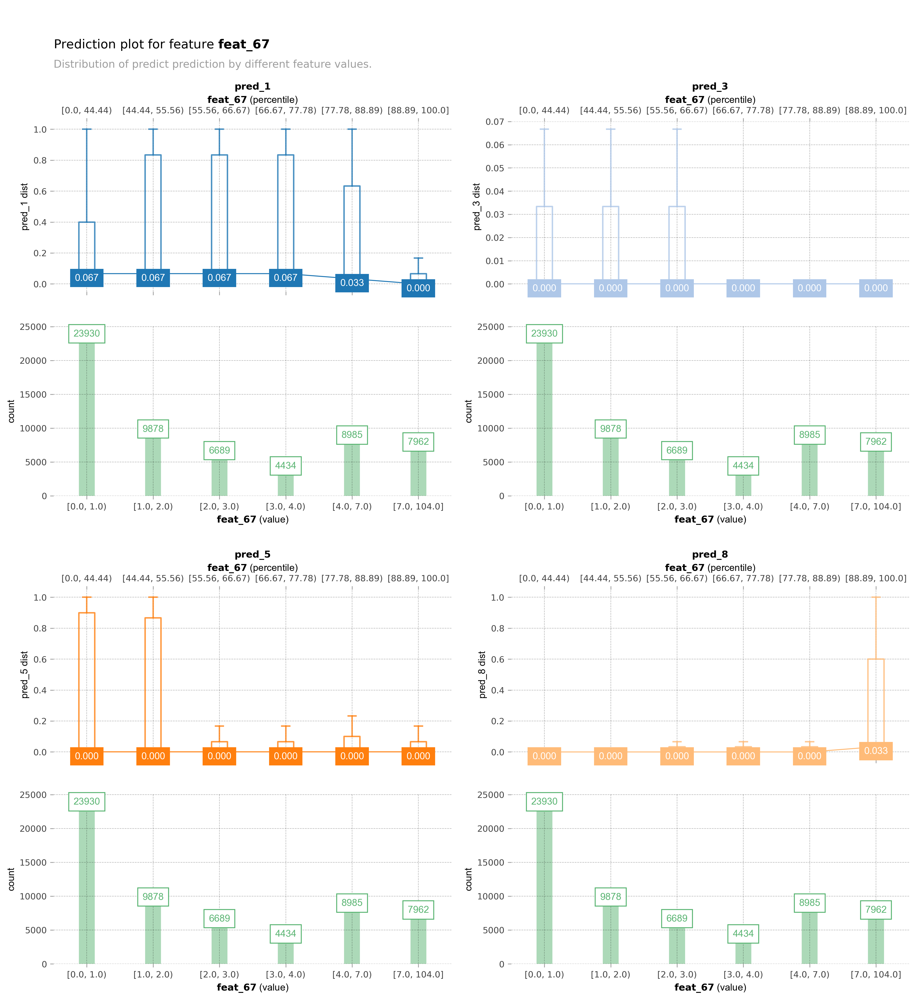

In [25]:
fig, axes, summary_df = predict_67.plot(
    which_classes=[1, 3, 5, 8],
    show_percentile=True,
    figsize=None,
    dpi=300,
    ncols=2,
    plot_params={"title": {"subplot_title": {"fontsize": 10}}, "gaps": {"outer_y": 0.25}},
    engine='matplotlib',
)

## 1.3 pdp for feature 'feat_67'

In [26]:
pdp_feat_67_rf = pdp.PDPIsolate(
    model=otto_model,
    df=otto_data,
    model_features=otto_features,
    feature="feat_67",
    feature_name="feat_67",
    chunk_size=10000,
)

obtain pred_func from the provided model.


100%|██████████| 7/7 [00:02<00:00,  2.81it/s]


In [27]:
fig, axes = pdp_feat_67_rf.plot(
    plot_lines=True,
    frac_to_plot=100,
    plot_pts_dist=True,
    to_bins=True,
    ncols=3,
    figsize=(1200, 400),
    show_percentile=False,
    plot_params={"pdp_hl": True, "gaps": {"outer_x": 0.06, "inner_y": 0.02, "outer_y": 0.1}},
    engine='plotly',
    template='plotly_white',
)
fig

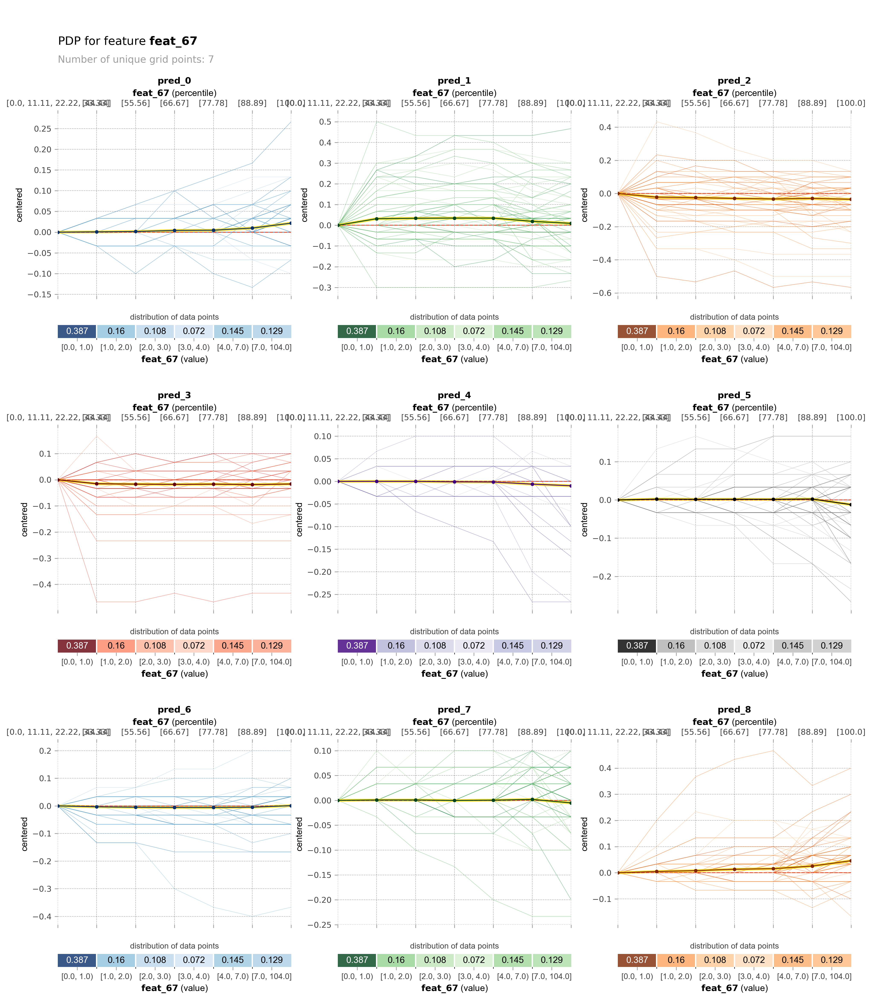

In [28]:
fig, axes = pdp_feat_67_rf.plot(
    plot_lines=True,
    frac_to_plot=100,
    plot_pts_dist=True,
    to_bins=True,
    figsize=(16, 6.5),
    show_percentile=True,
    ncols=3,
    plot_params={"pdp_hl": True, "title": {"subplot_title": {"fontsize": 10}}, "gaps": {"outer_y": 0.4}},
    engine='matplotlib',
)

# 2. Interaction between two variables: feat_67 and feat_25

## 2.1 target distribution through feature combination of 'feat_67' and 'feat_25'

In [29]:
target_67_25 = info_plots.InteractTargetPlot(
    df=otto_data,
    features=['feat_67', 'feat_25'],
    feature_names=['feat_67', 'feat_25'],
    target=otto_target[1:],
    num_grid_points=10,
    grid_types='percentile',
    percentile_ranges=None,
    grid_ranges=None,
    cust_grid_points=None,
    show_outliers=False,
    endpoints=True,
)

In [30]:
fig, axes, summary_df = target_67_25.plot(
    which_classes=[0, 1, 2, 3],
    show_percentile=False,
    figsize=None,
    ncols=2,
    annotate=False,
    plot_params={"gaps": {"inner_y": 0.06}},
    engine='plotly',
    template='plotly_white',
)
fig

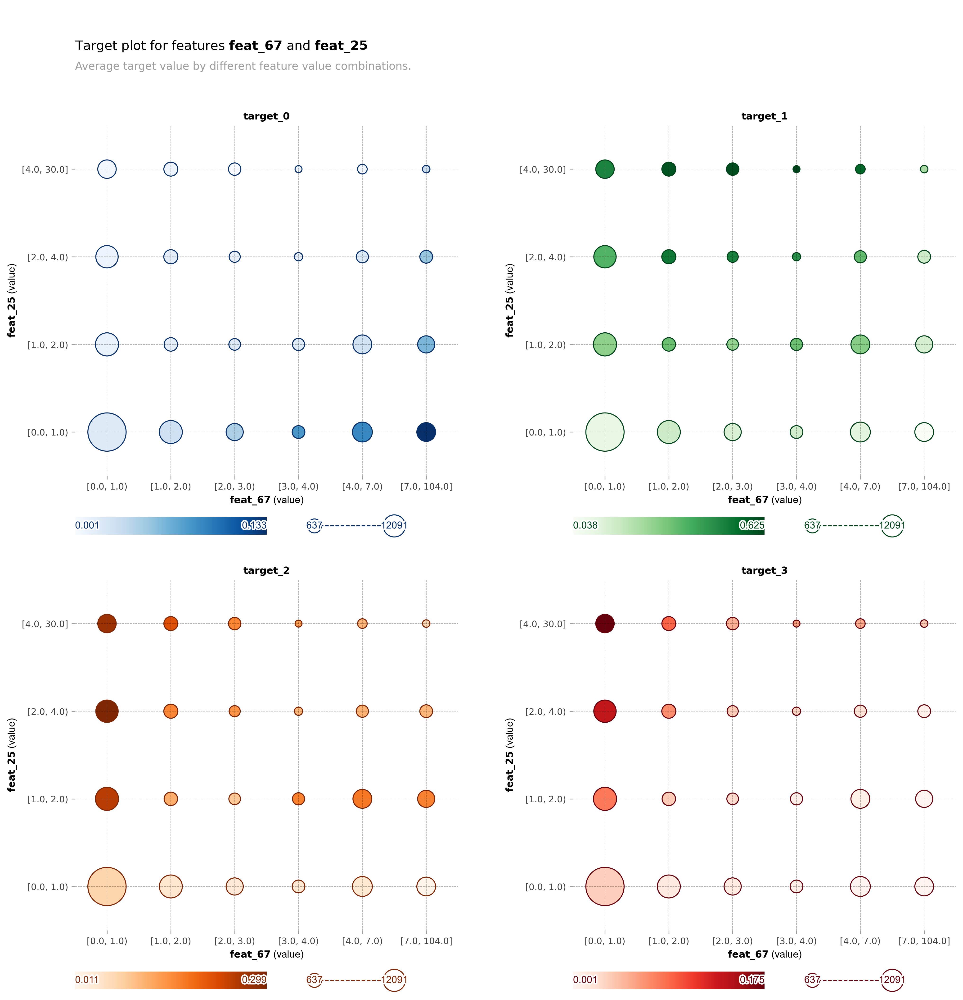

In [31]:
fig, axes, summary_df = target_67_25.plot(
    which_classes=[0, 1, 2, 3],
    show_percentile=False,
    figsize=None,
    dpi=300,
    ncols=2,
    annotate=False,
    plot_params={"title": {"subplot_title": {"fontsize": 10}}},
    engine='matplotlib',
)

## 2.2 prediction distribution through feature combination of 'feat_67' and 'feat_25'

In [32]:
predict_67_25 = info_plots.InteractPredictPlot(
    model=otto_model,
    df=otto_data,
    model_features=otto_features,
    features=['feat_67', 'feat_25'], 
    feature_names=['feat_67', 'feat_25'],
    pred_func=None,
    n_classes=None,
    num_grid_points=10,
    grid_types='percentile',
    percentile_ranges=None,
    grid_ranges=None,
    cust_grid_points=None,
    show_outliers=False,
    endpoints=True,
    predict_kwds={},
    chunk_size=-1,
)

obtain pred_func from the provided model.


In [33]:
fig, axes, summary_df = predict_67_25.plot(
    which_classes=[1, 3, 5, 6],
    show_percentile=False,
    figsize=None,
    ncols=2,
    annotate=False,
    plot_params={"gaps": {"inner_y": 0.06}},
    engine='plotly',
    template='plotly_white',
)
fig

In [28]:
summary_df.head()

,x1,x2,value_1,value_2,percentile_1,percentile_2,count,pred_0,pred_1,pred_2,pred_3,pred_4,pred_5,pred_6,pred_7,pred_8
0,0,0,"[0.0, 1.0)","[0.0, 1.0)","[0.0, 44.44)","[0.0, 66.67)",12091,0.0,0.000000,0.000000,0.000000,0.0,0.133333,0.0,0.0,0.0
1,0,1,"[0.0, 1.0)","[1.0, 2.0)","[0.0, 44.44)","[44.44, 77.78)",4571,0.0,0.133333,0.100000,0.000000,0.0,0.000000,0.0,0.0,0.0
2,0,2,"[0.0, 1.0)","[2.0, 4.0)","[0.0, 44.44)","[77.78, 88.89)",4280,0.0,0.233333,0.133333,0.033333,0.0,0.000000,0.0,0.0,0.0
3,0,3,"[0.0, 1.0)","[4.0, 30.0]","[0.0, 44.44)","[88.89, 100.0]",2988,0.0,0.466667,0.100000,0.033333,0.0,0.000000,0.0,0.0,0.0
4,1,0,"[1.0, 2.0)","[0.0, 1.0)","[44.44, 55.56)","[0.0, 66.67)",4505,0.0,0.000000,0.000000,0.000000,0.0,0.133333,0.0,0.0,0.0


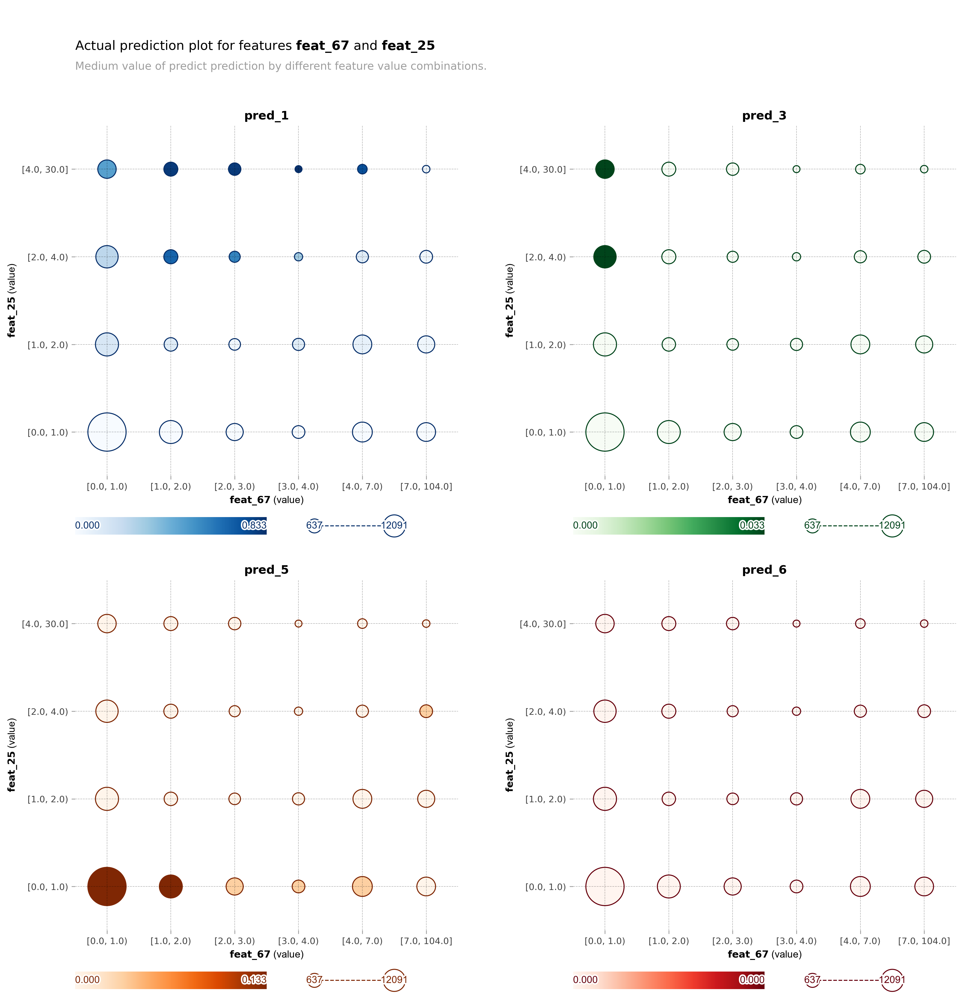

In [34]:
fig, axes, summary_df = predict_67_25.plot(
    which_classes=[1, 3, 5, 6],
    show_percentile=False,
    figsize=None,
    dpi=300,
    ncols=2,
    annotate=False,
    plot_params=None,
    engine='matplotlib',
)

## 2.3 pdp for feature combination of 'feat_67' and 'feat_25'

In [35]:
pdp_67_25 = pdp.PDPInteract(
    model=otto_model,
    df=otto_data,
    model_features=otto_features,
    features=['feat_67', 'feat_25'],
    feature_names=['feat_67', 'feat_25'],
)

obtain pred_func from the provided model.


100%|██████████| 7/7 [00:02<00:00,  2.95it/s]


obtain pred_func from the provided model.


100%|██████████| 5/5 [00:01<00:00,  3.06it/s]


obtain pred_func from the provided model.


100%|██████████| 35/35 [00:11<00:00,  3.04it/s]


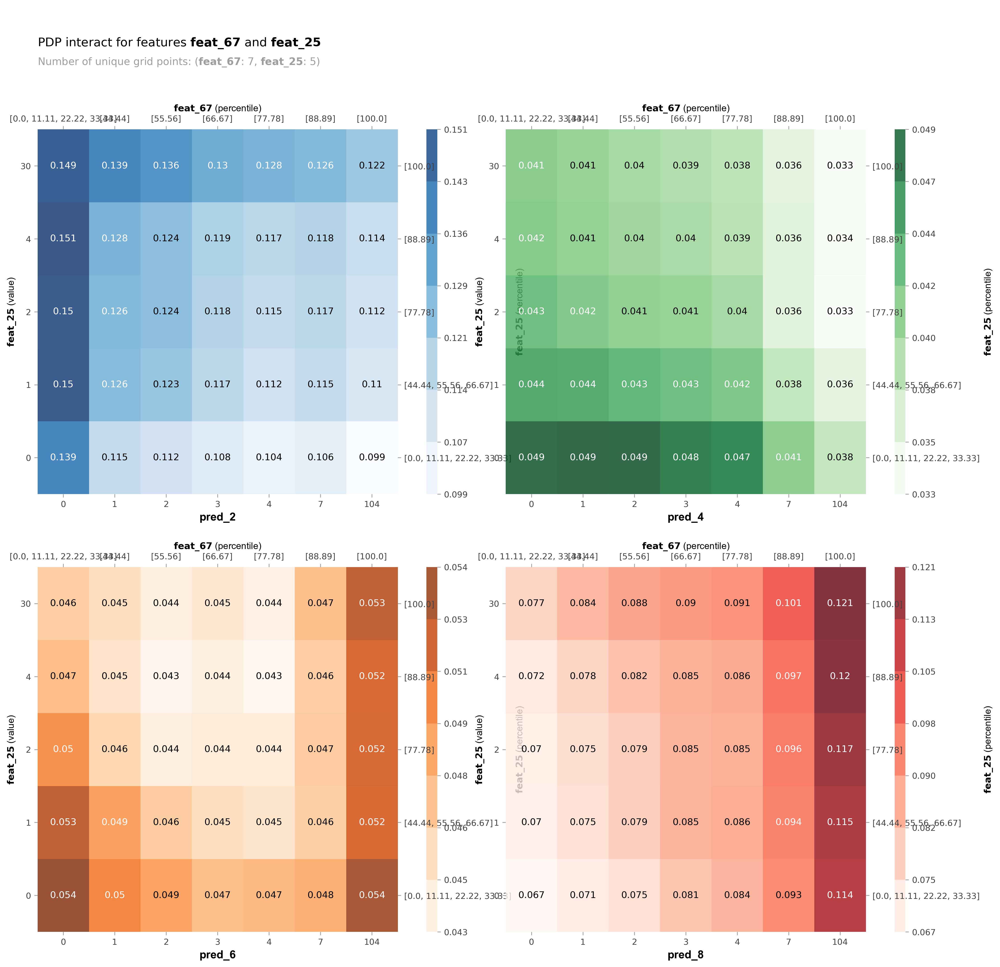

In [36]:
fig, axes = pdp_67_25.plot(
    plot_type="grid",
    to_bins=True,
    plot_pdp=False,
    show_percentile=True,
    which_classes=[2, 4, 6, 8],
    figsize=None,
    dpi=300,
    ncols=2,
    plot_params={"gaps": {"outer_y": 0.2}},
    engine="matplotlib",
    template="plotly_white",
)

In [37]:
fig, axes = pdp_67_25.plot(
    plot_type="contour",
    to_bins=True,
    plot_pdp=True,
    show_percentile=False,
    which_classes=[2, 4, 6, 8],
    figsize=None,
    dpi=300,
    ncols=2,
    plot_params=None,
    engine="plotly",
    template="plotly_white",
)
fig